In [ ]:
import numpy as np
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from pathlib import Path
import multiprocessing
from scipy.spatial.distance import cdist
import yaml

In [ ]:
def seed_everything(seed: int):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)

In [ ]:
# config
with open('config.yaml') as f:
    config = yaml.safe_load(f)

# globals variable
SEED = config['globals']['seed']
N_SPLITS = config['globals']['n_splits']
USE_FOLDS = config['globals']['use_folds']
DEBUG = config['globals']['debug']
EXP_MESSAGE = config['globals']['exp_message']
NOTES = config['globals']['notes']
EXP_NAME = str(Path().resolve()).split('/')[-1]

In [ ]:
import pickle
def to_pickle(filename, obj):
    with open(filename, mode='wb') as f:
        pickle.dump(obj, f)
        
def from_pickle(filename):
    with open(filename, mode='rb') as f:
        obj = pickle.load(f)
    return obj

In [ ]:
def get_ground_truth(args):
    (collectionName, phoneName), df = args
    
    path = root_dir / f"train/{collectionName}/{phoneName}/ground_truth.csv"
    target_df = pd.read_csv(path)
    output_df = pd.DataFrame()
    # merge derived and target by 'millisSinceGpsEpoch'
    for epoch, epoch_df in df.groupby('millisSinceGpsEpoch'):
        idx = (target_df['millisSinceGpsEpoch'] - epoch).abs().argmin()
        epoch_diff = epoch - target_df.loc[idx, 'millisSinceGpsEpoch']
        epoch_df['epoch_diff'] = epoch_diff
        epoch_df['target_latDeg'] = target_df.loc[idx, 'latDeg']
        epoch_df['target_lngDeg'] = target_df.loc[idx, 'lngDeg']
        epoch_df['speedMps'] = target_df.loc[idx, 'speedMps']
        output_df = pd.concat([output_df, epoch_df]).reset_index(drop=True)    
    return output_df

In [ ]:
import plotly.express as px

def visualize_trafic(df):
    fig = px.scatter_mapbox(df,
                            
                            # Here, plotly gets, (x,y) coordinates
                            lat="latDeg",
                            lon="lngDeg",
                            text='phoneName',
                            
                            #Here, plotly detects color of series
                            color="collectionName",
                            labels="collectionName",
                            
                            zoom=9,
                            center={"lat":37.423576, "lon":-122.094132},
                            height=600,
                            width=800)
    fig.update_layout(mapbox_style='stamen-terrain')
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(title_text="GPS trafic")
    fig.show()


def visualize_collection(df, root_dir=Path('../../input/'), hover_data=["elapsed_epoch", "speedMps"], collection_name='2021-04-29-US-SJC-2'):
    gt_df = pd.read_csv(root_dir / 'all_ground_truth.csv')
    gt_df['phoneName'] = 'ground truth'
    gt_df = pd.concat([df, gt_df])
    target_df = gt_df[gt_df['collectionName']==collection_name]   
    target_df['elapsed_epoch'] = ((target_df['millisSinceGpsEpoch'] - target_df['millisSinceGpsEpoch'].min()) / 1000)
    fig = px.scatter_mapbox(target_df,
                                
                            # Here, plotly gets, (x,y) coordinates
                            lat="latDeg",
                            lon="lngDeg",
                                
                            #Here, plotly detects color of series
                            color="phoneName",
                            labels="phoneName",
                            hover_data=hover_data,                

                                
                            zoom=9,
                            center={"lat":37.423576, "lon":-122.094132},
                            height=600,
                            width=800)
    fig.update_layout(mapbox_style='stamen-terrain')
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(title_text="{collection_name}")
    fig.show()

In [ ]:
# metric
def calc_haversine(lat1, lon1, lat2, lon2):
    """Calculates the great circle distance between two points
    on the earth. Inputs are array-like and specified in decimal degrees.
    """
    RADIUS = 6_367_000
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    dist = 2 * RADIUS * np.arcsin(a**0.5)
    return dist

def check_score(input_df: pd.DataFrame) -> pd.DataFrame:
    if "phone" not in input_df.columns:
        input_df["phone"] = input_df["collectionName"] + "_" + input_df["phoneName"]

    if "target_latDeg" not in input_df.columns:
        processes = multiprocessing.cpu_count()
        with multiprocessing.Pool(processes=processes) as pool:
            gr = input_df.groupby(['collectionName','phoneName'])
            dfs = pool.imap_unordered(get_ground_truth, gr)
            dfs = tqdm(dfs, total=len(gr))
            dfs = list(dfs)
        input_df = pd.concat(dfs).sort_values(['collectionName', 'phoneName', 'millisSinceGpsEpoch']).reset_index(drop=True)     


    output_df = input_df.copy()
    
    output_df['error'] = input_df.apply(
        lambda r: calc_haversine(
            r.latDeg, r.lngDeg, r.target_latDeg, r.target_lngDeg
        ),
        axis=1
    )

    meter_score = output_df['error'].mean()
    print(f'mean error: {meter_score}')

    scores = []
    p_50_scores = []
    p_95_scores = []
    mean_scores = []
    phones = []
    score_df = pd.DataFrame()
    for phone in output_df['phone'].unique():
        _index = output_df['phone']==phone
        p_50 = np.percentile(output_df.loc[_index, 'error'], 50)
        p_95 = np.percentile(output_df.loc[_index, 'error'], 95)
        # print(f"{phone} | 50:{p_50:.5g}| 95:{p_95:.5g}")
        p_50_scores.append(p_50)
        p_95_scores.append(p_95)
        mean_scores.append(np.mean([p_50, p_95]))
        phones.append(phone)

        scores.append(p_50)
        scores.append(p_95)

    score_df["phone"] = phones
    score_df["p_50_score"] = p_50_scores
    score_df["p_95_score"] = p_95_scores
    score_df["mean_score"] = mean_scores
    
    comp_score = sum(scores) / len(scores)
    print(f"competition metric:{comp_score}")
    return output_df, score_df

In [ ]:
import simdkalman

# define kf model
T = 1.0
state_transition = np.array([[1, 0, T, 0, 0.5 * T ** 2, 0], [0, 1, 0, T, 0, 0.5 * T ** 2], [0, 0, 1, 0, T, 0],
                             [0, 0, 0, 1, 0, T], [0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1]])
process_noise = np.diag([1e-5, 1e-5, 5e-6, 5e-6, 1e-6, 1e-6]) + np.ones((6, 6)) * 1e-9
observation_model = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0]])
observation_noise = np.diag([5e-5, 5e-5]) + np.ones((2, 2)) * 1e-9

kf = simdkalman.KalmanFilter(
        state_transition = state_transition,
        process_noise = process_noise,
        observation_model = observation_model,
        observation_noise = observation_noise)

In [ ]:
def apply_kf_smoothing(df, kf_=kf):
    unique_paths = df[['collectionName', 'phoneName']].drop_duplicates().to_numpy()
    for collection, phone in tqdm(unique_paths):
        cond = np.logical_and(df['collectionName'] == collection, df['phoneName'] == phone)
        data = df[cond][['latDeg', 'lngDeg']].to_numpy()
        data = data.reshape(1, len(data), 2)
        smoothed = kf_.smooth(data)
        df.loc[cond, 'latDeg'] = smoothed.states.mean[0, :, 0]
        df.loc[cond, 'lngDeg'] = smoothed.states.mean[0, :, 1]
    return df

In [ ]:
def linear_interpolation(input_df, speed_thr=45):
    dfs = pd.DataFrame()
    for (collectionName, phoneName), df in input_df.groupby(['collectionName','phoneName']):

        df['delta'] = calc_haversine(df['latDeg'], df['lngDeg'], df['latDeg'].shift(1), df['lngDeg'].shift(1))
        df['time_delta'] = df['millisSinceGpsEpoch'] - df['millisSinceGpsEpoch'].shift(1)
        df['delta'].fillna(0, inplace=True)
        df['time_delta'].fillna(0, inplace=True)
        df['speed'] = df['delta'] / (df['time_delta']/1000)  # m/s
        df['speed'].fillna(0, inplace=True)

        # 一度欠損値にする
        df.loc[speed_thr<df['speed'], ['latDeg', 'lngDeg']] = np.nan
        df['dummy_datetime'] = pd.to_datetime(df['millisSinceGpsEpoch'])
        df = df.set_index('dummy_datetime')

        # 時間に合わせて線形補間
        df = df.interpolate(method='time').reset_index(drop=True)
        dfs = pd.concat([dfs, df]).reset_index(drop=True)
    return dfs

In [ ]:
# data womizumasi
def make_lerp_data(df):
    '''
    Generate interpolated lat,lng values for different phone times in the same collection.
    '''
    org_columns = df.columns
    
    # Generate a combination of time x collection x phone and combine it with the original data (generate records to be interpolated)
    time_list = df[['collectionName', 'millisSinceGpsEpoch']].drop_duplicates()
    phone_list =df[['collectionName', 'phoneName']].drop_duplicates()
    tmp = time_list.merge(phone_list, on='collectionName', how='outer')
 
    lerp_df = tmp.merge(df, on=['collectionName', 'millisSinceGpsEpoch', 'phoneName'], how='left')

    lerp_df['phone'] = lerp_df['collectionName'] + '_' + lerp_df['phoneName']
    lerp_df = lerp_df.sort_values(['phone', 'millisSinceGpsEpoch'])

    # linear interpolation
    lerp_df['latDeg_prev'] = lerp_df['latDeg'].shift(1)
    lerp_df['latDeg_next'] = lerp_df['latDeg'].shift(-1)
    lerp_df['lngDeg_prev'] = lerp_df['lngDeg'].shift(1)
    lerp_df['lngDeg_next'] = lerp_df['lngDeg'].shift(-1)
    lerp_df['phone_prev'] = lerp_df['phone'].shift(1)
    lerp_df['phone_next'] = lerp_df['phone'].shift(-1)
    lerp_df['time_prev'] = lerp_df['millisSinceGpsEpoch'].shift(1)
    lerp_df['time_next'] = lerp_df['millisSinceGpsEpoch'].shift(-1)


    # Leave only records to be interpolated(missing coords data)
    lerp_df = lerp_df[(lerp_df['latDeg'].isnull())&(lerp_df['phone']==lerp_df['phone_prev'])&(lerp_df['phone']==lerp_df['phone_next'])].copy()
    # calc lerp
    lerp_df['latDeg'] = lerp_df['latDeg_prev'] + ((lerp_df['latDeg_next'] - lerp_df['latDeg_prev']) * ((lerp_df['millisSinceGpsEpoch'] - lerp_df['time_prev']) / (lerp_df['time_next'] - lerp_df['time_prev']))) 
    lerp_df['lngDeg'] = lerp_df['lngDeg_prev'] + ((lerp_df['lngDeg_next'] - lerp_df['lngDeg_prev']) * ((lerp_df['millisSinceGpsEpoch'] - lerp_df['time_prev']) / (lerp_df['time_next'] - lerp_df['time_prev']))) 
    
    # Leave only the data that has a complete set of previous and next data.
    lerp_df = lerp_df[~lerp_df['latDeg'].isnull()]

    return lerp_df[org_columns]


def calc_mean_pred(df, lerp_df):
    '''
    Make a prediction based on the average of the predictions of phones in the same collection.
    '''
    add_lerp = pd.concat([df, lerp_df])
    mean_pred_result = add_lerp.groupby(['collectionName', 'millisSinceGpsEpoch'])[['latDeg', 'lngDeg']].mean().reset_index()
    mean_pred_df = df[['collectionName', 'phoneName', 'millisSinceGpsEpoch', 'pred']].copy()
    mean_pred_df = mean_pred_df.merge(mean_pred_result[['collectionName', 'millisSinceGpsEpoch', 'latDeg', 'lngDeg']], on=['collectionName', 'millisSinceGpsEpoch'], how='left')
    return mean_pred_df


def apply_mean(df):
    lerp = make_lerp_data(df)
    mean_df = calc_mean_pred(df, lerp)
    return mean_df

In [ ]:
def get_removedevice(input_df: pd.DataFrame, device: str) -> pd.DataFrame:
    input_df['index'] = input_df.index
    input_df = input_df.sort_values('millisSinceGpsEpoch')
    input_df.index = input_df['millisSinceGpsEpoch'].values

    output_df = pd.DataFrame() 
    for _, subdf in input_df.groupby('collectionName'):

        phones = subdf['phoneName'].unique()

        if (len(phones) == 1) or (not device in phones):
            output_df = pd.concat([output_df, subdf])
            continue

        origin_df = subdf.copy()
        
        _index = subdf['phoneName']==device
        subdf.loc[_index, 'latDeg'] = np.nan
        subdf.loc[_index, 'lngDeg'] = np.nan
        subdf = subdf.interpolate(method='index', limit_area='inside')

        _index = subdf['latDeg'].isnull()
        subdf.loc[_index, 'latDeg'] = origin_df.loc[_index, 'latDeg'].values
        subdf.loc[_index, 'lngDeg'] = origin_df.loc[_index, 'lngDeg'].values

        output_df = pd.concat([output_df, subdf])

    output_df.index = output_df['index'].values
    output_df = output_df.sort_index()

    del output_df['index']
    
    return output_df

In [ ]:
road_points = pd.read_csv('../../input/all_ground_truth.csv')
road_points["place"] = road_points["collectionName"].str[11:]
road_points = road_points[["lngDeg", "latDeg", "place"]]

In [ ]:
def snap_to_grid(sub, min_thr, max_thr):
    """
    Snap to grid if within a threshold.
    
    x, y are the predicted points.
    x_, y_ are the closest grid points.
    _x_, _y_ are the new predictions after post processing.
    """
    sub['_latDeg_'] = sub['latDeg']
    sub['_lngDeg_'] = sub['lngDeg']
    sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), '_latDeg_'] = sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), 'matched_latDeg']
    sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), '_lngDeg_'] = sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), 'matched_lngDeg']
    return sub.copy()

from scipy.spatial.distance import cdist

def add_xy(df):
    df['point'] = [(x, y) for x,y in zip(df['lngDeg'], df['latDeg'])]
    return df

def closest_point(point, points):
    """ Find closest point from a list of points. """
    return points[cdist([point], points).argmin()]


def matching_point(target_df, target_road_points=road_points):
    # place = target_df["place"].unique()[0]
    # target_road_points = road_points[road_points["place"]==place]
    target_df['matched_point'] = [closest_point(x, list(target_road_points['point'])) for x in tqdm(target_df['point'])]
    target_df['lngDeg'] = target_df['matched_point'].apply(lambda x: x[0])
    target_df['latDeg'] = target_df['matched_point'].apply(lambda x: x[1])
    return target_df


def apply_snap_to_grid(df, road_points, phase="train"):

    df["place"] = df["collectionName"].str[11:]

    df = add_xy(df)
    road_points = add_xy(road_points)
    df_list = []
    ncpu = multiprocessing.cpu_count()
    for place, target_df in tqdm(df.groupby("place")):

        if ((phase=="train")&(place in ['US-SJC-1', 'US-SJC-2'])) | ((phase=="test")&(place in ['US-SJC-2', 'US-SJC-3'])):
            target_df = target_df.reset_index(drop=True)
            k = round(len(target_df)/ncpu)
            target_dfs = [target_df.loc[i:i+k-1, :] for i in range(0, len(target_df), k)]
            with multiprocessing.Pool(processes=ncpu) as pool:
                dfs = pool.imap_unordered(matching_point, target_dfs)
                dfs = list(tqdm(dfs, total=len(target_dfs)))
                df = pd.concat(dfs)
            df_list.append(df)
        else:
            df_list.append(target_df)

    df = pd.concat(df_list).reset_index(drop=True)
    return df

In [ ]:
# waypointを補正したdataset
root_dir = Path('../../input/google-smartphone-decimeter-challenge')

In [ ]:
train_df = pd.read_csv(root_dir / "baseline_locations_train_with_speed.csv")
train_df, score_df = check_score(train_df)
# score_df.sort_values("mean_score", ascending=False).head(10).style.bar(subset=['p_50_score', 'p_95_score', 'mean_score'], color=['teal'])

  0%|          | 0/73 [00:00<?, ?it/s]

mean error: 3.8468483749952074
competition metric:5.287970649047862


In [ ]:
train_df = linear_interpolation(train_df)
train_df, score_df = check_score(train_df)
# score_df.sort_values("mean_score", ascending=False).head(10).style.bar(subset=['p_50_score', 'p_95_score', 'mean_score'], color=['teal'])

mean error: 3.6010082912730264
competition metric:5.260302858969158


In [ ]:
train_df = apply_kf_smoothing(train_df)
train_df, score_df = check_score(train_df)
# score_df.sort_values("mean_score", ascending=False).head(10).style.bar(subset=['p_50_score', 'p_95_score', 'mean_score'], color=['teal'])

  0%|          | 0/73 [00:00<?, ?it/s]

mean error: 3.152398745382418
competition metric:4.540498531316787


In [ ]:
train_df = apply_mean(train_df)
train_df, score_df = check_score(train_df)
# score_df.sort_values("mean_score", ascending=False).head(10).style.bar(subset=['p_50_score', 'p_95_score', 'mean_score'], color=['teal'])

  0%|          | 0/73 [00:00<?, ?it/s]

mean error: 2.9059163056773833
competition metric:4.094267372573323


In [ ]:
train_df = get_removedevice(train_df, 'SamsungS20Ultra')
train_df, score_df = check_score(train_df)
# score_df.sort_values("mean_score", ascending=False).head(10).style.bar(subset=['p_50_score', 'p_95_score', 'mean_score'], color=['teal'])

mean error: 2.8177360198594963
competition metric:3.948139633349392


In [ ]:
train_df = apply_snap_to_grid(train_df, road_points)
train_df, score_df = check_score(train_df)
# score_df.sort_values("mean_score", ascending=False).head(10).style.bar(subset=['p_50_score', 'p_95_score', 'mean_score'], color=['teal'])

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

mean error: 2.6457261898900777
competition metric:3.6993411284352624


In [ ]:

# def get_stopping_group(a, n=5):
#     rle = [[a[0], 1]]

#     for elem in a[1: ]:
#         if rle[-1][0] == elem:
#             rle[-1][1] += 1
#         else:
#             rle.append([elem, 1])
#     id = 1
#     result = []
#     for elem, cnt in rle:
#         if elem == 1 and cnt >= n:
#             result += [id] * cnt
#             id += 1
#         else:
#             result += [0] * cnt
#     return result


# def apply_stopping_mean(input_df, speed_thr=0.5, count_thr=20):
#     # 速度が1m/s以下のものは停止しているとみなしてその近い時間で平均を取る
#     input_df['is_stopping'] = 0
#     input_df.loc[input_df['pred']<=count_thr, 'is_stopping'] = 1

#     df_list = []
#     for (collection_name, phone_name), df in input_df.groupby(['collectionName', 'phoneName']):
#         a = df.sort_values('millisSinceGpsEpoch')['is_stopping'].to_numpy()
#         df["stopping_group"] = get_stopping_group(a, n=count_thr)
#         stopping_point_df = df[df["stopping_group"]==1].groupby("stopping_group")[["latDeg", "lngDeg"]].median().reset_index()
    
#         if len(stopping_point_df) > 1:
#             df_list.append(df)
#         else:
#             for i, row in stopping_point_df.iterrows():
                
#                 df.loc[df["stopping_group"]==row["stopping_group"], "latDeg"] = row["latDeg"]
#                 df.loc[df["stopping_group"]==row["stopping_group"], "lngDeg"] = row["lngDeg"]
#             df_list.append(df)

#     output_df = pd.concat(df_list).reset_index(drop=True)
#     return output_df

def stopping_mean(input_df, start_buffer=20000, end_buffer=20000, speed_thr=0.0, dist_thr=20):
    output_df = pd.DataFrame()
    for (collection_name, phone_name), df in input_df.groupby(['collectionName', 'phoneName']):
        # min_epoch = df['millisSinceGpsEpoch'].min()
        # max_epoch = df['millisSinceGpsEpoch'].max()
        min_epoch = df['millisSinceGpsEpoch'].sort_values(ascending=True).to_numpy()[5]
        max_epoch = df['millisSinceGpsEpoch'].sort_values(ascending=False).to_numpy()[5]

        start_point_row = df[df['millisSinceGpsEpoch'] == max_epoch]
        df["dist_from_start"] = calc_haversine(
            df["latDeg"], df["lngDeg"], 
            np.repeat(start_point_row["latDeg"].to_numpy(), len(df)), 
            np.repeat(start_point_row["lngDeg"].to_numpy(),len(df)))
        query = (df['millisSinceGpsEpoch'] <= min_epoch + start_buffer) & (df["pred"] <= speed_thr) & (df["dist_from_start"] <= dist_thr)
        start_stopping_group_df = df[query]

        if len(start_stopping_group_df) > 1:
            start_latdeg = start_stopping_group_df['latDeg'].mean()
            start_lngdeg = start_stopping_group_df['lngDeg'].mean()
            df.loc[query, 'latDeg'] = start_latdeg 
            df.loc[query, 'lngDeg'] = start_lngdeg 
        

        end_point_row = df[df['millisSinceGpsEpoch'] == max_epoch]
        df["dist_from_end"] = calc_haversine(
            df["latDeg"], df["lngDeg"], 
            np.repeat(end_point_row["latDeg"].to_numpy(), len(df)), 
            np.repeat(end_point_row["lngDeg"].to_numpy(),len(df)))
        query = (max_epoch - end_buffer <= df['millisSinceGpsEpoch']) & (df["pred"] <= speed_thr) & (df["dist_from_end"] <= dist_thr)
        end_stopping_group_df = df[query]

        if len(end_stopping_group_df) > 1:
            end_latdeg = end_stopping_group_df['latDeg'].mean()
            end_lngdeg = end_stopping_group_df['lngDeg'].mean()
            df.loc[query, 'latDeg'] = end_latdeg 
            df.loc[query, 'lngDeg'] = end_lngdeg
        
        output_df = pd.concat([output_df, df])
    return output_df.sort_index()


In [ ]:
import warnings
warnings.simplefilter('ignore')



In [ ]:
params = {
  'start_buffer': 300000,
  'end_buffer': 264000,
  'speed_thr': 0.9631417203664067,
  'dist_thr': 19}


_train_df = stopping_mean(train_df, **params)
_train_df, score_df = check_score(_train_df)

mean error: 2.617785848201693
competition metric:3.638920076947137


In [ ]:
_train_df = apply_mean(_train_df)
_train_df, score_df = check_score(_train_df)

  0%|          | 0/73 [00:00<?, ?it/s]

mean error: 2.6047097897924396
competition metric:3.6212700740491424


In [ ]:
# import optuna


# def objective(trial):

#     start_buffer = trial.suggest_int("start_buffer", 10000, 300000, 2000)
#     end_buffer = trial.suggest_int("end_buffer", 10000, 300000, 2000)
#     speed_thr = trial.suggest_float("speed_thr", 0.0, 2.0)
#     dist_thr = trial.suggest_int("dist_thr", 1, 30, 2)
#     input_df = stopping_mean(train_df, start_buffer=start_buffer, end_buffer=end_buffer, speed_thr=speed_thr, dist_thr=dist_thr)

#     if "phone" not in input_df.columns:
#         input_df["phone"] = input_df["collectionName"] + "_" + input_df["phoneName"]

#     if "target_latDeg" not in input_df.columns:
#         processes = multiprocessing.cpu_count()
#         with multiprocessing.Pool(processes=processes) as pool:
#             gr = input_df.groupby(['collectionName','phoneName'])
#             dfs = pool.imap_unordered(get_ground_truth, gr)
#             dfs = tqdm(dfs, total=len(gr))
#             dfs = list(dfs)
#         input_df = pd.concat(dfs).sort_values(['collectionName', 'phoneName', 'millisSinceGpsEpoch']).reset_index(drop=True)     


#     output_df = input_df.copy()
    
#     output_df['error'] = input_df.apply(
#         lambda r: calc_haversine(
#             r.latDeg, r.lngDeg, r.target_latDeg, r.target_lngDeg
#         ),
#         axis=1
#     )

#     meter_score = output_df['error'].mean()

#     scores = []
#     p_50_scores = []
#     p_95_scores = []
#     mean_scores = []
#     phones = []
#     score_df = pd.DataFrame()
#     for phone in output_df['phone'].unique():
#         _index = output_df['phone']==phone
#         p_50 = np.percentile(output_df.loc[_index, 'error'], 50)
#         p_95 = np.percentile(output_df.loc[_index, 'error'], 95)
#         # print(f"{phone} | 50:{p_50:.5g}| 95:{p_95:.5g}")
#         p_50_scores.append(p_50)
#         p_95_scores.append(p_95)
#         mean_scores.append(np.mean([p_50, p_95]))
#         phones.append(phone)

#         scores.append(p_50)
#         scores.append(p_95)

#     score_df["phone"] = phones
#     score_df["p_50_score"] = p_50_scores
#     score_df["p_95_score"] = p_95_scores
#     score_df["mean_score"] = mean_scores
    
#     comp_score = sum(scores) / len(scores)
#     return comp_score

In [ ]:
# study = optuna.create_study()
# study.optimize(objective, n_trials=100)

In [ ]:
# study.best_params, study.best_value

In [ ]:
# _train_df = stopping_mean(train_df, **study.best_params)
# _, _ = check_score(_train_df)

# for phone, df in _train_df.groupby("phone"):
#     _train_df["elapsed_time"] = (_train_df["millisSinceGpsEpoch"] - _train_df["millisSinceGpsEpoch"].min()) / 1000
#     _train_df = pd.concat([_train_df, df]).reset_index(drop=True)
# _train_df["elapsed_time"] = _train_df["elapsed_time"].astype(str)

In [ ]:
collection_name = train_df['collectionName'].unique()[4]
target_df = _train_df[_train_df['collectionName']==collection_name]

In [ ]:
# calc_haversine(_train_df['latDeg'], _train_df['lngDeg'], _train_df['target_latDeg'], _train_df['target_lngDeg']).mean()
_, _, = check_score(target_df)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
print(mean_squared_error(target_df['speedMps'], target_df['pred']))
print(mean_absolute_error(target_df['speedMps'], target_df['pred']))

0.03082893165494696
0.11252117780426646


<AxesSubplot:>

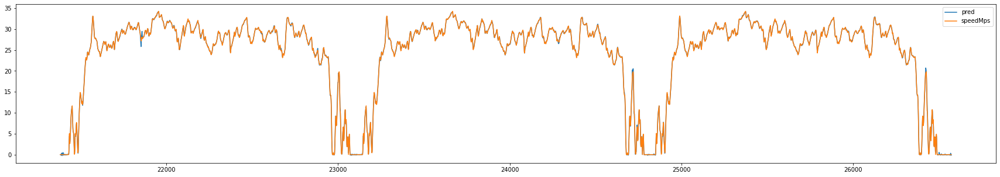

In [ ]:
target_df[['pred', 'speedMps']].plot(figsize=(30,5))

In [ ]:
gt_df = pd.read_csv('../../input/all_ground_truth.csv')
gt_df = gt_df[gt_df['collectionName']==collection_name]
gt_df['phoneName'] = 'ground truth'
df = pd.concat([target_df, gt_df])
df['elapsed_epoch'] = ((df['millisSinceGpsEpoch'] - df['millisSinceGpsEpoch'].min()) / 1000)
fig = px.scatter_mapbox(df,                              
                        # Here, plotly gets, (x,y) coordinates
                        lat="latDeg",
                        lon="lngDeg",
                        # text='elapsed_time',
                            
                        #Here, plotly detects color of series
                        color="phoneName",
                        labels="phoneName",
                        hover_data=['elapsed_epoch', 'speedMps', 'pred'],
                            
                        zoom=9,
                        center={"lat":37.423576, "lon":-122.094132},
                        height=600,
                        width=800)
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
# fig.update_layout(title_text="{collection_name}")
fig.show()

In [ ]:
_train_df = _train_df[['collectionName', 'phoneName','phone', 'latDeg', 'lngDeg', 'millisSinceGpsEpoch']]

,collectionName,phoneName,millisSinceGpsEpoch,pred,latDeg,lngDeg,phone,epoch_diff,target_latDeg,target_lngDeg,speedMps,error
0,2020-05-14-US-MTV-1,Pixel4,1273529463442,0.101259,37.423549,-122.094006,2020-05-14-US-MTV-1_Pixel4,0,37.423576,-122.094132,0.0,11.478435
1,2020-05-14-US-MTV-1,Pixel4,1273529464442,0.025110,37.423564,-122.094063,2020-05-14-US-MTV-1_Pixel4,0,37.423576,-122.094132,0.0,6.235337
2,2020-05-14-US-MTV-1,Pixel4,1273529465442,-0.016409,37.423573,-122.094098,2020-05-14-US-MTV-1_Pixel4,0,37.423576,-122.094132,0.0,3.064335
3,2020-05-14-US-MTV-1,Pixel4,1273529466442,0.015611,37.423578,-122.094116,2020-05-14-US-MTV-1_Pixel4,0,37.423576,-122.094132,0.0,1.426618
4,2020-05-14-US-MTV-1,Pixel4,1273529467442,0.009828,37.423571,-122.094115,2020-05-14-US-MTV-1_Pixel4,0,37.423576,-122.094132,0.0,1.618001
...,...,...,...,...,...,...,...,...,...,...,...,...
131337,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760315000,0.025891,37.334478,-121.899610,2021-04-29-US-SJC-2_SamsungS20Ultra,0,37.334475,-121.899613,0.0,0.519000
131338,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760316000,0.016220,37.334478,-121.899610,2021-04-29-US-SJC-2_SamsungS20Ultra,0,37.334475,-121.899613,0.0,0.518582
131339,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760317000,0.064718,37.334478,-121.899610,2021-04-29-US-SJC-2_SamsungS20Ultra,0,37.334475,-121.899613,0.0,0.518534
131340,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760318000,-0.012927,37.334478,-121.899610,2021-04-29-US-SJC-2_SamsungS20Ultra,0,37.334475,-121.899613,0.0,0.521963


In [ ]:
_train_df.to_csv('')

## test

In [ ]:
test_df = pd.read_csv(root_dir / "baseline_locations_test_with_speed.csv")
sub_df = pd.read_csv(root_dir / 'sample_submission.csv')

In [ ]:
test_df = linear_interpolation(test_df)
test_df = apply_kf_smoothing(test_df)
test_df = apply_mean(test_df)
test_df = get_removedevice(test_df, 'SamsungS20Ultra')
test_df = apply_snap_to_grid(test_df, road_points, phase="test")
test_df = stopping_mean(test_df, **params)
test_df = apply_mean(test_df)

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

In [ ]:
test_df['phone'] = test_df['collectionName'] + "_" + test_df['phoneName']

In [ ]:
test_df2 = pd.DataFrame()
for phone, df in test_df.groupby("phone"):
    df["elapsed_time"] = (df["millisSinceGpsEpoch"] - df["millisSinceGpsEpoch"].min()) / 1000
    test_df2 = pd.concat([test_df2, df]).reset_index(drop=True)
test_df2["elapsed_time"] = test_df2["elapsed_time"].astype(str)

fig = px.scatter_mapbox(test_df2,                              
                        # Here, plotly gets, (x,y) coordinates
                        lat="latDeg",
                        lon="lngDeg",
                        text='elapsed_time',
                            
                        #Here, plotly detects color of series
                        color="phoneName",
                        labels="phoneName",
                            
                        zoom=9,
                        center={"lat":37.423576, "lon":-122.094132},
                        height=600,
                        width=800)
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
# fig.update_layout(title_text="{collection_name}")
fig.show()


In [ ]:
sub_df = sub_df.drop(['latDeg', 'lngDeg'], axis=1).merge(test_df[['phone', 'millisSinceGpsEpoch', 'latDeg', 'lngDeg']], on=['phone', 'millisSinceGpsEpoch'])
sub_df.to_csv(f'{EXP_NAME}_submission.csv', index=False)

In [ ]:
_sub_df = pd.read_csv(f'../exp021/exp021_submission.csv')

In [ ]:
calc_haversine(sub_df['latDeg'],sub_df['lngDeg'],_sub_df['latDeg'], _sub_df['lngDeg']).mean()

0.0736964355780975